### Importing the required libraries

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import time
from moviepy.editor import VideoFileClip
%matplotlib qt
%matplotlib inline

### Supporting functions

In [2]:
def extract_video_frames(file_name):
    vidcap = cv2.VideoCapture(file_name)
    success,image = vidcap.read()
    count = 0
    success = True
    while success:
        success, image = vidcap.read()
        cv2.imwrite("video_frames/frame%d.jpg" % time.time(), image)
        count += 1
        
extract_video_frames("test_videos/project_video.mp4")

In [3]:
def print_two_images(img1, img2, title1, title2):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img1)
    ax1.set_title(title1, fontsize=50)
    ax2.imshow(img2, cmap='gray')
    ax2.set_title(title2, fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
def read_image(file_path):
    return mpimg.imread(file_path)

### Camera calibration

In [4]:
def calibrate_camera():
    nx, ny = 6, 9
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:ny,0:nx].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Make a list of calibration images
    images = glob.glob('camera_cal/calibration*.jpg')

    # Step through the list and search for chessboard corners
    for fname in images:
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (ny,nx),None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
        else:
            print("This image could not be used for callibration: " + fname)

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

    print("Amount of images used for calibration: " + str(len(images)))
    print("Amount of sucessfull calibrations: " + str(len(objpoints)))
    
    return mtx, dist

mtx, dist = calibrate_camera()

This image could not be used for callibration: camera_cal/calibration1.jpg
This image could not be used for callibration: camera_cal/calibration4.jpg
This image could not be used for callibration: camera_cal/calibration5.jpg
Amount of images used for calibration: 20
Amount of sucessfull calibrations: 17


 ## Applying a distortion correction to raw images

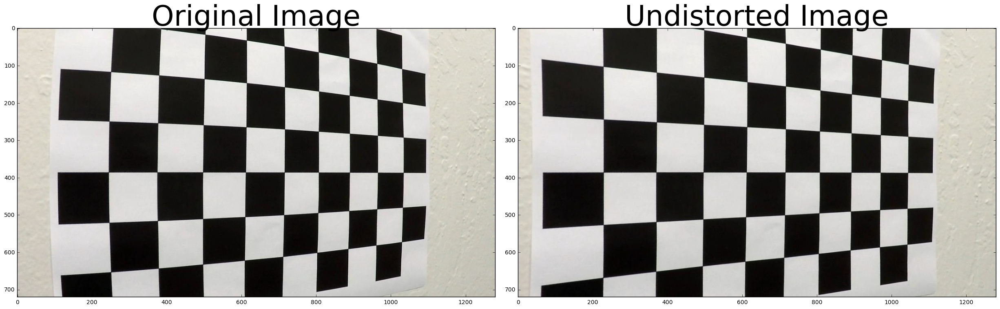

In [5]:
def undistort_image(img, mtx, dist):
    return cv2.undistort(img, mtx, dist, None, mtx)

img1 = read_image("camera_cal/calibration5.jpg")
img2 = undistort_image(img1, mtx, dist)

print_two_images(img1, img2, "Original Image", "Undistorted Image")

### Applying thresholding to an image

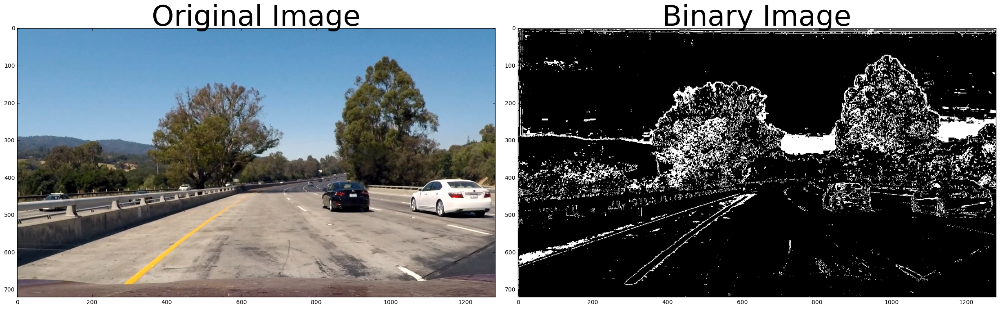

In [6]:
def apply_threshold(img, sobel_thresh_min=30, sobel_thresh_max=72, s_thresh_min=80, s_thresh_max=117):
    # Convert to HLS color space and separate the S channel
    # Note: img is the undistorted image
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]

    # Grayscale image
    # NOTE: we already saw that standard grayscaling lost color information for the lane lines
    # Explore gradients in other colors spaces / color channels to see what might work better
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sobel_thresh_min) & (scaled_sobel <= sobel_thresh_max)] = 1

    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    return combined_binary

filename = "test_images/test1.jpg"
img1 = read_image(filename)
img2= apply_threshold(img1)

print_two_images(img1, img2, "Original Image", "Binary Image")

### Bird view

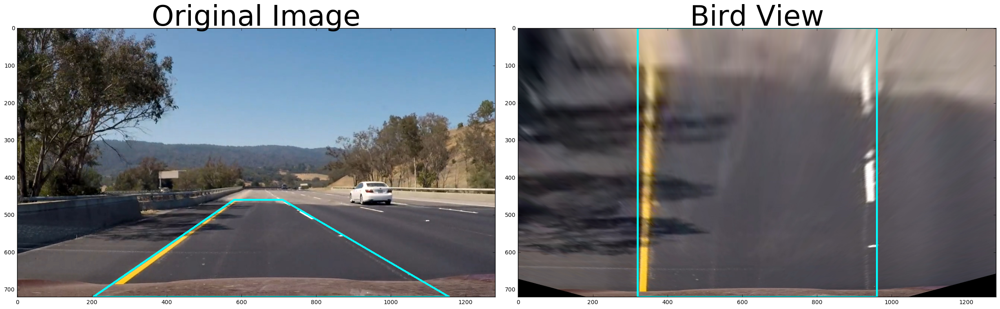

In [7]:
def apply_transform(image, draw_poly=False):
    img_size = [image.shape[1], image.shape[0]]

    src = np.float32(
         [[(img_size[0] / 2) - 60, img_size[1] / 2 + 100],
         [((img_size[0] / 6) - 10), img_size[1]],
         [(img_size[0] * 5 / 6) + 90, img_size[1]],
         [(img_size[0] / 2 + 70), img_size[1] / 2 + 100]])
    dst = np.float32(
         [[(img_size[0] / 4), 0],
         [(img_size[0] / 4), img_size[1]],
         [(img_size[0] * 3 / 4), img_size[1]],
         [(img_size[0] * 3 / 4), 0]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(image, M, (image.shape[1],image.shape[0]), flags=cv2.INTER_LINEAR)
    
    if draw_poly:
        src_poly = np.array(((src[0][0], src[0][1]), (src[1][0], src[1][1]), (src[2][0], src[2][1]), (src[3][0], src[3][1])), np.int32)
        cv2.polylines(image, [src_poly], True, (0,255,255),3)
    
        dst_poly = np.array(((dst[0][0], dst[0][1]), (dst[1][0], dst[1][1]), (dst[2][0], dst[2][1]), (dst[3][0], dst[3][1])), np.int32)
        cv2.polylines(warped, [dst_poly], True, (0,255,255),3)
    
    return warped, cv2.getPerspectiveTransform(dst, src)
    
filename = "test_images/frame_with_light.jpg"
img1 = read_image(filename)
img2, Minv = apply_transform(img1, draw_poly=True)

print_two_images(img1, img2, "Original Image", "Bird View")

### Detecting the lane lines for the first frame

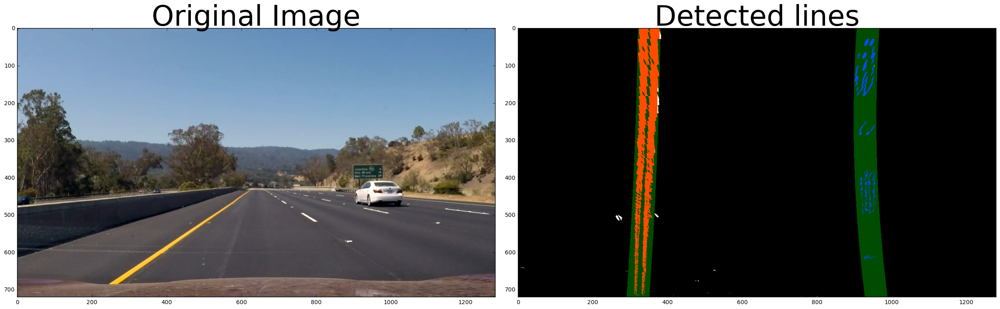

In [8]:
def detect_lines_sliding_window(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 30
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    return result, left_fit, right_fit, ploty, left_fitx, right_fitx
    

filename = "test_images/light_2.jpg"
img1 = read_image(filename)

undistorted = undistort_image(img1, mtx, dist)
binarized = apply_threshold(undistorted)
bird_view, Minv = apply_transform(binarized)
detected_lines, left_fit, right_fit, ploty, left_fitx, right_fitx = detect_lines_sliding_window(bird_view)

print_two_images(img1, detected_lines, "Original Image", "Detected lines")

### Detecting follow up lines

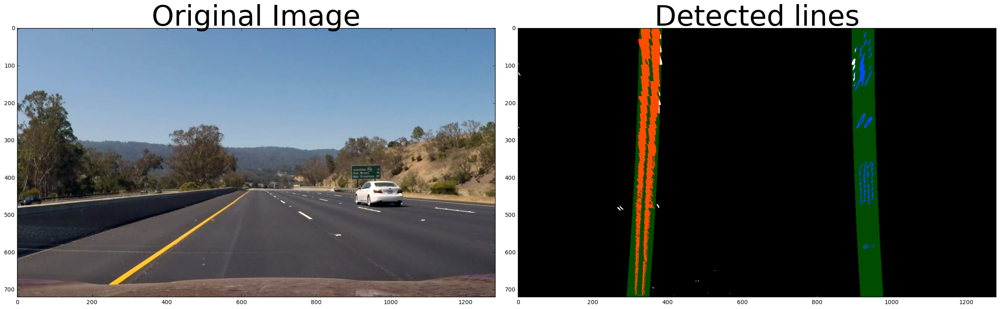

In [9]:
def detect_lines(image, left_fit, right_fit):
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 30
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, image.shape[0]-1, image.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((image, image, image))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    return result, left_fit, right_fit, ploty, left_fitx, right_fitx

    
filename = "test_images/light_1.jpg"
img1 = read_image(filename)

undistorted = undistort_image(img1, mtx, dist)
binarized = apply_threshold(undistorted)
bird_view, Minv = apply_transform(binarized)
detected_lines, left_fit, right_fit, ploty, left_fitx, right_fitx = detect_lines(bird_view, left_fit, right_fit)

print_two_images(img1, detected_lines, "Original Image", "Detected lines")

### Measuring the curverad of the lines

In [10]:
def measure_curverad(image, left_fitx, right_fitx, ploty):
    ##MEASUREMENT
    y_eval = np.max(ploty)
    ym_per_pix = 30 / 720  # meters per pixel in y dimension
    xm_per_pix = 3.7 / 700  # meters per pixel in x dimension

    position_of_the_car = (image.shape[1] / 2 - left_fitx[len(left_fitx)-1]) * xm_per_pix

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty * ym_per_pix, left_fitx * xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty * ym_per_pix, right_fitx * xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2 * left_fit_cr[0] * y_eval * ym_per_pix + left_fit_cr[1]) ** 2) ** 1.5) / np.absolute(
        2 * left_fit_cr[0])
    right_curverad = ((1 + (2 * right_fit_cr[0] * y_eval * ym_per_pix + right_fit_cr[1]) ** 2) ** 1.5) / np.absolute(
        2 * right_fit_cr[0])
    
    return left_curverad, right_curverad, position_of_the_car

left_curverad, right_curverad, position_of_the_car = measure_curverad(bird_view, left_fitx, right_fitx, ploty)

print("Left curverad " + str(left_curverad) + " m")
print("Right curverad " + str(right_curverad) + " m")
print("Position of the car from the left lane " + str(position_of_the_car) + " m")

Left curverad 3830.51545459 m
Right curverad 3580.06847515 m
Position of the car from the left lane 1.68570941945 m


### Projecting the lanes back onto the road

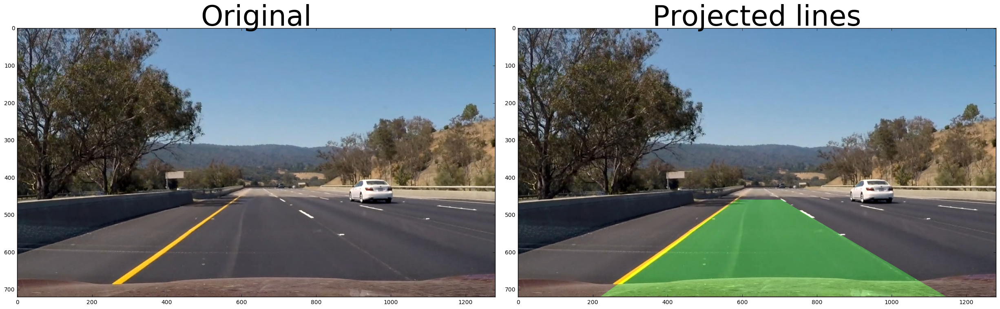

In [11]:
def project_line(original, warped, left_fitx, right_fitx, ploty, minv):
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (warped.shape[1], warped.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(original, 1, newwarp, 0.3, 0)
    return result

filename = "test_images/problem_frame.jpg"
img1 = read_image(filename)

undistorted = undistort_image(img1, mtx, dist)
binarized = apply_threshold(undistorted)
bird_view, Minv = apply_transform(binarized)
detected_lines, left_fit, right_fit, ploty, left_fitx, right_fitx = detect_lines(bird_view, left_fit, right_fit)
with_lines = project_line(img1, bird_view, left_fitx, right_fitx, ploty, Minv)

print_two_images(img1, with_lines, "Original", "Projected lines")

### Complete pipeline

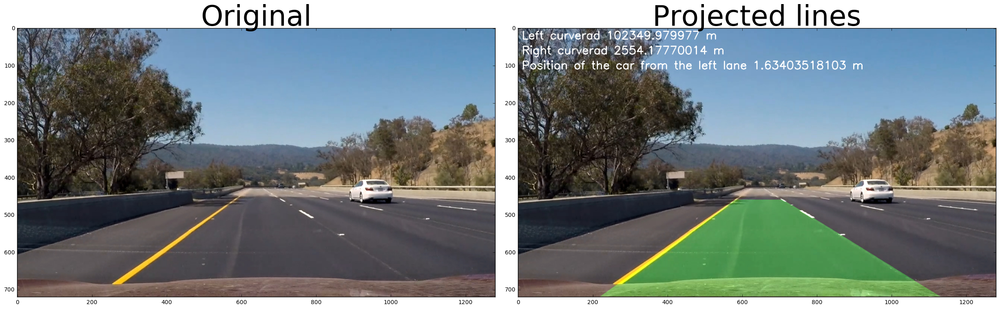

In [12]:
def process_image(input_image):
    global mtx, dist, left_fit, right_fit, ploty, left_fitx, right_fitx, index
    
    undistorted = undistort_image(input_image, mtx, dist)
    bird_view, Minv = apply_transform(undistorted)
    binarized = apply_threshold(bird_view)

    #Use sliding windows every 10 frames
    if index == 0:
        detected_lines, left_fit, right_fit, ploty, left_fitx, right_fitx = detect_lines_sliding_window(binarized)
        index += 1
    else:
        detected_lines, left_fit, right_fit, ploty, left_fitx, right_fitx = detect_lines(binarized, left_fit, right_fit) 
        if index == 10:
            index = 0

    with_lines = project_line(input_image, binarized, left_fitx, right_fitx, ploty, Minv)
    
    #Every 10 frames print out the line curverage
    if index == 1:
        left_curverad, right_curverad, position_of_the_car = measure_curverad(img1, left_fitx, right_fitx, ploty)
    
    cv2.putText(with_lines, "Left curverad " + str(left_curverad) + " m", (10,30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),2)
    cv2.putText(with_lines, "Right curverad " + str(right_curverad) + " m", (10,70), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),2)
    cv2.putText(with_lines, "Position of the car from the left lane " + str(position_of_the_car) + " m", (10,110), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),2)
    
    return with_lines


index = 0
filename = "test_images/problem_frame.jpg"
img1 = read_image(filename)
with_lines = process_image(img1)
print_two_images(img1, with_lines, "Original", "Projected lines")

### Testing the pipeline on images

In [13]:
def process_test_image(image_name):
    image = read_image("test_images/" + image_name)
    processed_image = process_image(image)
    mpimg.imsave("output_images/" + image_name, processed_image)
    

all_test_images = os.listdir("test_images")
for test_image in all_test_images:
    process_test_image(test_image)

### Testing the pipeline on a video

In [14]:
def process_test_video(video_name):
    input_clip = VideoFileClip("test_videos/" + video_name)
    output_clip = input_clip.fl_image(process_image)
    %time output_clip.write_videofile("output_videos/" + video_name, audio=False)
    
process_test_video("project_video.mp4")

[MoviePy] >>>> Building video output_videos/project_video.mp4
[MoviePy] Writing video output_videos/project_video.mp4


100%|█████████▉| 1260/1261 [02:48<00:00,  6.63it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/project_video.mp4 

CPU times: user 10min 53s, sys: 1min, total: 11min 53s
Wall time: 2min 49s
